# Badly predicted proteins

In [1]:
from IPython.utils import io

with io.capture_output() as captured:
    !pip install matplotlib_venn
    !pip install py3Dmol

print(captured.stdout if ("Error" in captured.stdout) or ("ERROR" in captured.stdout) else "Installation successful")

Installation successful


In [2]:
import pandas as pd

In [3]:
chains = pd.read_csv("data/chains_evaluation.csv")
chains

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_vs_OF_TM_score,...,EF_vs_AF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_vs_OF_RMSD,OF_vs_EF_RMSD,EF_vs_AF_RMSD,sequence,sequence_length,method_of_acquisition
0,8P0E,monomer,8P0E:A,93.108947,93.535368,89.263158,0.966687,0.967459,0.982825,0.995942,...,0.978701,1.757680,1.738276,0.703625,0.332187,1.373544,1.427521,MADSDIVESYARAAGPVHLRVRDIMDPPPGCKVVVNAANEGLLAGS...,190,X-RAY DIFFRACTION
1,8PX8,monomer,8PX8:A,95.914087,95.609217,95.147826,0.995011,0.995740,0.989534,0.995857,...,0.987997,0.275844,0.253193,0.706370,0.252605,0.671283,0.694650,GSMGKLSEQLKHCNGILKELLSKKHAAYAWPFYKPVDASALGLHDY...,115,X-RAY DIFFRACTION
2,8B2E,monomer,8B2E:A,97.636503,97.136084,94.762238,0.991946,0.979414,0.990990,0.982193,...,0.996032,0.400699,0.668645,0.425292,0.612311,0.497249,0.279309,LVLPGLDALQTRNALAIIAEAKKENVGPHGCQAAITTGLTESSLRI...,143,X-RAY DIFFRACTION
3,8HOE,monomer,8HOE:A,93.577196,79.554392,89.613757,0.988360,0.863854,0.976008,0.873645,...,0.993624,0.564870,2.354328,0.834659,2.298557,2.257695,0.398065,MGSSHHHHHHAFHDVPSLGQKVGAGSQKDVFHSRQDPRQCICLFRP...,189,X-RAY DIFFRACTION
4,8TCE,monomer,8TCE:A,90.252128,89.159681,86.180851,0.938542,0.920785,0.920808,0.948216,...,0.947691,1.805852,2.571247,2.617893,1.681326,0.509903,1.830767,APTENSTGVQDCYRGDGQSYRGTLSTTITGRTCQSWSSMTPHWHRR...,94,X-RAY DIFFRACTION
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,8G9J,synthetic,8G9J:A,90.586771,92.542063,89.071749,0.637726,0.984365,0.984592,0.625623,...,0.623380,6.550639,0.678841,0.674661,6.686531,0.287093,6.716066,HHHHHHSGSGENLYFQGSGSEEIVEEAETALKALLEEAEKGGKEDA...,223,X-RAY DIFFRACTION
1459,8OYV,synthetic,8OYV:A,86.604205,88.043795,82.605128,0.981296,0.979309,0.980517,0.992664,...,0.989139,0.725727,0.761958,0.734274,0.453600,0.643009,0.556589,MNEEKREELLEEAKRLLEESLKLLKQAYNTPIEIDLPISGGVKAIL...,195,X-RAY DIFFRACTION
1460,8TNO,synthetic,8TNO:A,90.392837,90.149504,87.758865,0.966437,0.966444,0.958189,0.986057,...,0.968848,1.621622,1.482032,1.525321,0.932028,1.400783,1.206631,MGSVEEVKRIMDLARQKISDAMDELNMDATLKQSVDESMKRAEQRA...,282,X-RAY DIFFRACTION
1461,8FJE,synthetic,8FJE:A,93.426345,93.104138,88.586207,0.970529,0.965841,0.972681,0.995234,...,0.993875,0.845441,0.909988,0.804459,0.302041,0.403145,0.341156,SGSPTPLETLPLEELERRALKIYLRRHGSVPEEEIETMPLEELERK...,145,X-RAY DIFFRACTION


## TM score

Cutoff for TM-score: 0.5 (Xu et Zhang, 2010)

In [4]:
AF_bad_TM_score = set(chains[chains["AF_TM_score"] < 0.5]["chain_id"])
print(len(AF_bad_TM_score))

72


In [5]:
OF_bad_TM_score = set(chains[chains["OF_TM_score"] < 0.5]["chain_id"])
print(len(OF_bad_TM_score))

190


In [6]:
EF_bad_TM_score = set(chains[chains["EF_TM_score"] < 0.5]["chain_id"])
print(len(EF_bad_TM_score))

141


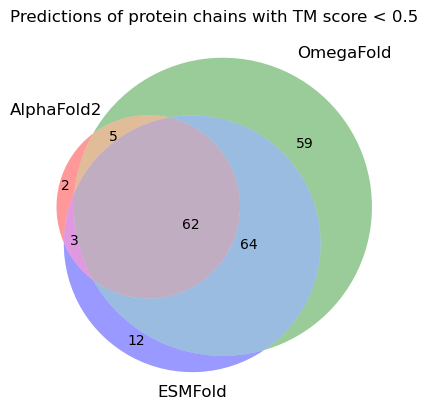

In [7]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3

venn3([AF_bad_TM_score, OF_bad_TM_score, EF_bad_TM_score], ('AlphaFold2', 'OmegaFold', 'ESMFold'))
plt.title("Predictions of protein chains with TM score < 0.5")
plt.show()

## RMSD

In [8]:
AF_bad_RMSD = set(chains[chains["AF_RMSD"] > 9]["chain_id"])
print(len(AF_bad_RMSD))

115


In [9]:
OF_bad_RMSD = set(chains[chains["OF_RMSD"] > 9]["chain_id"])
print(len(OF_bad_RMSD))

235


In [10]:
EF_bad_RMSD = set(chains[chains["EF_RMSD"] > 9]["chain_id"])
print(len(EF_bad_RMSD))

197


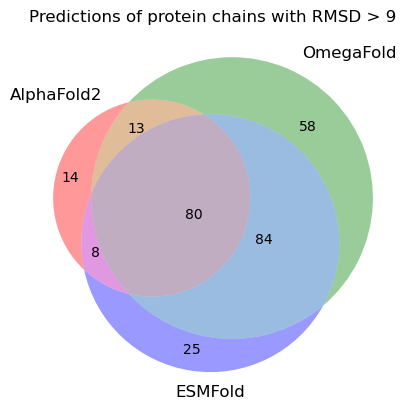

In [11]:
venn3([AF_bad_RMSD, OF_bad_RMSD, EF_bad_RMSD], ('AlphaFold2', 'OmegaFold', 'ESMFold'))
plt.title("Predictions of protein chains with RMSD > 9")
plt.show()

## pLDDT

In [12]:
AF_bad_pLDDT = set(chains[chains["AF_average_pLDDT"] < 70]["chain_id"])
print(len(AF_bad_pLDDT))

39


In [13]:
OF_bad_pLDDT = set(chains[chains["OF_average_pLDDT"] < 70]["chain_id"])
print(len(OF_bad_pLDDT))

210


In [14]:
EF_bad_pLDDT = set(chains[chains["EF_average_pLDDT"] < 70]["chain_id"])
print(len(EF_bad_pLDDT))

180


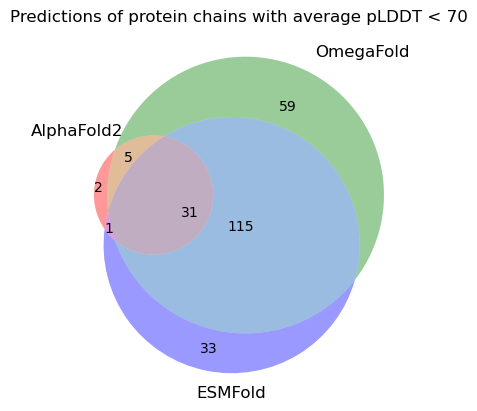

In [15]:
venn3([AF_bad_pLDDT, OF_bad_pLDDT, EF_bad_pLDDT], ('AlphaFold2', 'OmegaFold', 'ESMFold'))
plt.title("Predictions of protein chains with average pLDDT < 70")
plt.show()

## AlphaFold

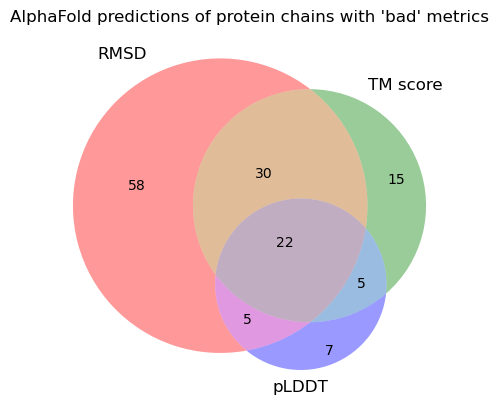

In [16]:
venn3([AF_bad_RMSD, AF_bad_TM_score, AF_bad_pLDDT], ('RMSD', 'TM score', 'pLDDT'))
plt.title("AlphaFold predictions of protein chains with 'bad' metrics")
plt.show()

## OmegaFold

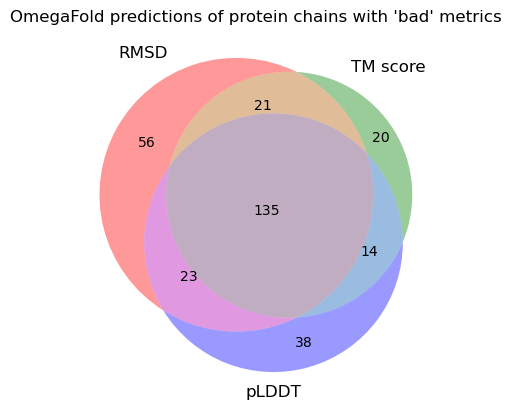

In [17]:
venn3([OF_bad_RMSD, OF_bad_TM_score, OF_bad_pLDDT], ('RMSD', 'TM score', 'pLDDT'))
plt.title("OmegaFold predictions of protein chains with 'bad' metrics")
plt.show()

## ESMFold

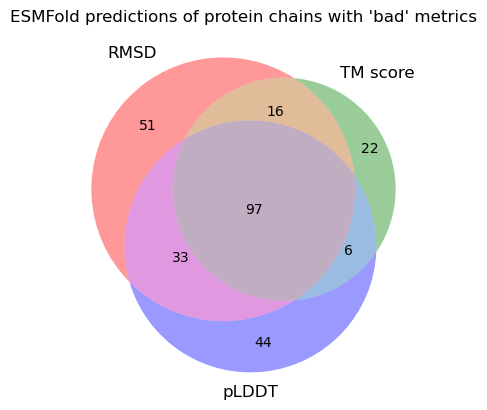

In [18]:
venn3([EF_bad_RMSD, EF_bad_TM_score, EF_bad_pLDDT], ('RMSD', 'TM score', 'pLDDT'))
plt.title("ESMFold predictions of protein chains with 'bad' metrics")
plt.show()

## Worst AlphaFold predictions

In [19]:
chains.nlargest(3, "AF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_vs_OF_TM_score,...,EF_vs_AF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_vs_OF_RMSD,OF_vs_EF_RMSD,EF_vs_AF_RMSD,sequence,sequence_length,method_of_acquisition
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,0.351279,...,0.516884,111.591237,56.989083,78.661937,120.335396,94.428249,52.332074,NRADDARNEVLRGNLVRAELWYRQIQENDQLKLENKGLKTDLREKE...,356,ELECTRON MICROSCOPY
1451,8P4Y,synthetic,8P4Y:A,90.574975,83.017264,73.572139,0.202441,0.260387,0.379051,0.334095,...,0.288187,80.594256,43.101753,30.652166,65.784382,35.445296,68.729006,GSPEDEIERLERENEKLERENERLEREIRWLEEGSGQLEDKVEELL...,201,X-RAY DIFFRACTION
783,8J8I,monomer,8J8I:A,62.653857,50.351786,50.021429,0.180013,0.230217,0.182883,0.237239,...,0.283447,34.768679,26.939025,43.058583,26.117607,25.244734,24.510545,GLLDPKLSYLLLGILFIYGVILTALFLRVKFSRSADAPAYQQGQNQ...,140,SOLUTION NMR


In [20]:
import py3Dmol
import numpy as np
from Bio.PDB import PDBParser, PDBIO

def align_and_save(pdb_path, pdb_path_aligned, rotation_path, translation_path):
    structure = PDBParser().get_structure("prediction", pdb_path)[0]
    structure.transform(np.load(rotation_path), np.load(translation_path))
    io = PDBIO()
    io.set_structure(structure)
    io.save(pdb_path_aligned)


def display_two_structures(pdb_path_reference, pdb_path_prediction):
    view = py3Dmol.view()
    view.addModel(open(pdb_path_reference, 'r').read(), 'pdb')
    view.addModel(open(pdb_path_prediction, 'r').read(), 'pdb')
    view.setStyle({'cartoon': {'color': 'green'}})
    # (the predicted structure is red, https://william-dawson.github.io/using-py3dmol.html)
    view.setStyle({'model': -1}, {'cartoon': {'color': 'red'}})
    view.zoomTo()
    view.show()


def align_and_display(protein_directory, pdb_id, chain_id, tool):
    align_and_save(
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}_aligned.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/rotation.npy",
        f"{protein_directory}/{pdb_id}/{tool}/translation.npy"
    )
    display_two_structures(
        f"{protein_directory}/{pdb_id}/{pdb_id}_original.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}_aligned.pdb"
    )

In [21]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "alphafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [22]:
align_and_display("data/proteins", "8P4Y", "8P4Y:A", "alphafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [23]:
align_and_display("data/proteins", "8J8I", "8J8I:A", "alphafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Worst ESMFold predictions

In [24]:
chains.nlargest(3, "EF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_vs_OF_TM_score,...,EF_vs_AF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_vs_OF_RMSD,OF_vs_EF_RMSD,EF_vs_AF_RMSD,sequence,sequence_length,method_of_acquisition
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,0.351279,...,0.516884,111.591237,56.989083,78.661937,120.335396,94.428249,52.332074,NRADDARNEVLRGNLVRAELWYRQIQENDQLKLENKGLKTDLREKE...,356,ELECTRON MICROSCOPY
783,8J8I,monomer,8J8I:A,62.653857,50.351786,50.021429,0.180013,0.230217,0.182883,0.237239,...,0.283447,34.768679,26.939025,43.058583,26.117607,25.244734,24.510545,GLLDPKLSYLLLGILFIYGVILTALFLRVKFSRSADAPAYQQGQNQ...,140,SOLUTION NMR
617,8EW5,monomer,8EW5:A,64.717632,56.464342,40.901316,0.447963,0.260032,0.260019,0.315043,...,0.270568,20.465529,29.940409,31.587262,26.787156,7.118956,27.951532,MWADEEPAPWDIEETPAEQAPEASAESAAPAAEAATGEKPKIKLEK...,152,ELECTRON MICROSCOPY


In [25]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "esmfold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [26]:
align_and_display("data/proteins", "8J8I", "8J8I:A", "esmfold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [27]:
align_and_display("data/proteins", "8EW5", "8EW5:A", "esmfold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Worst OmegaFold predictions

In [28]:
chains.nlargest(3, "OF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_vs_OF_TM_score,...,EF_vs_AF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_vs_OF_RMSD,OF_vs_EF_RMSD,EF_vs_AF_RMSD,sequence,sequence_length,method_of_acquisition
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,0.351279,...,0.516884,111.591237,56.989083,78.661937,120.335396,94.428249,52.332074,NRADDARNEVLRGNLVRAELWYRQIQENDQLKLENKGLKTDLREKE...,356,ELECTRON MICROSCOPY
1451,8P4Y,synthetic,8P4Y:A,90.574975,83.017264,73.572139,0.202441,0.260387,0.379051,0.334095,...,0.288187,80.594256,43.101753,30.652166,65.784382,35.445296,68.729006,GSPEDEIERLERENEKLERENERLEREIRWLEEGSGQLEDKVEELL...,201,X-RAY DIFFRACTION
617,8EW5,monomer,8EW5:A,64.717632,56.464342,40.901316,0.447963,0.260032,0.260019,0.315043,...,0.270568,20.465529,29.940409,31.587262,26.787156,7.118956,27.951532,MWADEEPAPWDIEETPAEQAPEASAESAAPAAEAATGEKPKIKLEK...,152,ELECTRON MICROSCOPY


In [29]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "omegafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [30]:
align_and_display("data/proteins", "8P4Y", "8P4Y:A", "omegafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [31]:
align_and_display("data/proteins", "8EW5", "8EW5:A", "omegafold")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol